# 🔍 PCB Defect & Component Detection: Ground Truth vs Model Predictions

This notebook allows interactive comparison of **Ground Truth** annotations against **Model Predictions** across our benchmarked and novel YOLO models.
- Compare any trained model (`yolov11s`, `yolov26s_loss_reweight`, `yolov26s_bbox_cappaste`, `yolov9s`, etc.)
- Side-by-side visualization with distinct colors for the 4 target classes:
  - **Capacitor** (Cyan)
  - **Connector** (Gold / Yellow)
  - **Electrolytic Capacitor** (Magenta)
  - **IC** (Lime Green)
- Inspect confidence thresholds, IoU overlap, and missed detections.

In [1]:
# 1. Setup & Imports
import os
import glob
from pathlib import Path
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from ultralytics import YOLO

%matplotlib inline
plt.rcParams['figure.dpi'] = 150
print("Libraries successfully imported!")

Libraries successfully imported!


In [2]:
# 2. Define Target Classes and Visual Styles
RAW_CLASSES = [
    "Button", "Capacitor Jumper", "Capacitor", "Clock", "Connector",
    "Diode", "EM", "Electrolytic Capacitor", "Ferrite Bead", "IC",
    "Inductor", "Jumper", "Led", "Pads", "Pins", "Resistor",
    "Resistor Jumper", "Resistor Network", "Switch", "Test Point",
    "Transistor", "Unknown", "Variable Resistor"
]

# Evaluated 4 target classes
EVAL_CLASSES = {2: "Capacitor", 4: "Connector", 7: "Electrolytic Capacitor", 9: "IC"}

CLASS_COLORS = {
    "Capacitor": (0, 220, 255),               # Cyan
    "Connector": (255, 190, 0),               # Gold
    "Electrolytic Capacitor": (255, 50, 180), # Magenta
    "IC": (0, 255, 100),                      # Bright Green
    "Other": (180, 180, 180)                  # Light Gray
}

def get_color(class_name):
    return CLASS_COLORS.get(class_name, CLASS_COLORS["Other"])

In [3]:
# 3. Discover Available Trained Checkpoints
weight_files = sorted(glob.glob("runs/**/best.pt", recursive=True))

print(f"Found {len(weight_files)} trained models locally:")
for idx, wf in enumerate(weight_files):
    model_name = wf.split('/')[1]
    print(f"  [{idx}] {model_name:35s} -> {wf}")

Found 20 trained models locally:
  [0] yolov10s                            -> runs/yolov10s/pcb-filtered/weights/best.pt
  [1] yolov11s                            -> runs/yolov11s/pcb-filtered/weights/best.pt
  [2] yolov11s_bbox_cappaste              -> runs/yolov11s_bbox_cappaste/pcb-filtered/weights/best.pt
  [3] yolov11s_loss_reweight              -> runs/yolov11s_loss_reweight/pcb-filtered/weights/best.pt
  [4] yolov12s                            -> runs/yolov12s/pcb-filtered/weights/best.pt
  [5] yolov26s                            -> runs/yolov26s/pcb-filtered/weights/best.pt
  [6] yolov26s_bbox_cappaste              -> runs/yolov26s_bbox_cappaste/pcb-filtered/weights/best.pt
  [7] yolov26s_compound_reweight_cappaste -> runs/yolov26s_compound_reweight_cappaste/pcb-filtered/weights/best.pt
  [8] yolov26s_focal_loss_native          -> runs/yolov26s_focal_loss_native/pcb-filtered/weights/best.pt
  [9] yolov26s_geo_hsv_aug                -> runs/yolov26s_geo_hsv_aug/pcb-filtered/weig

In [4]:
# 4. Helper Functions to Draw Ground Truth and Predictions
def load_ground_truth(txt_path, img_w, img_h):
    boxes = []
    if not os.path.exists(txt_path):
        return boxes
    with open(txt_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) >= 5:
                cls_id = int(parts[0])
                cx, cy, w, h = map(float, parts[1:5])
                x1 = int((cx - w / 2) * img_w)
                y1 = int((cy - h / 2) * img_h)
                x2 = int((cx + w / 2) * img_w)
                y2 = int((cy + h / 2) * img_h)
                cls_name = RAW_CLASSES[cls_id] if cls_id < len(RAW_CLASSES) else f"Class_{cls_id}"
                boxes.append((cls_id, cls_name, x1, y1, x2, y2))
    return boxes

def draw_boxes(image, boxes, is_prediction=False):
    img = image.copy()
    h, w = img.shape[:2]
    for b in boxes:
        if is_prediction:
            cls_id, cls_name, conf, x1, y1, x2, y2 = b
            label = f"{cls_name} {conf:.2f}"
        else:
            cls_id, cls_name, x1, y1, x2, y2 = b
            label = cls_name
            
        # Highlight evaluated target classes
        if cls_name not in EVAL_CLASSES.values() and cls_id not in EVAL_CLASSES:
            continue  # Filter to the 4 key classes for clarity
            
        color = get_color(cls_name)
        cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
        
        # Label background
        y_label = max(y1 - 6, 12)
        (tw, th), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.4, 1)
        cv2.rectangle(img, (x1, y_label - th - 2), (x1 + tw + 2, y_label + 2), color, -1)
        cv2.putText(img, label, (x1 + 1, y_label), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 0, 0), 1, cv2.LINE_AA)
    return img

In [5]:
# 5. Select Model and Run Inference
# Choose any model name (e.g. 'yolov11s', 'yolov26s_loss_reweight', 'yolov26s_bbox_cappaste')
CHOSEN_MODEL = "yolov11s"  # <-- Change this to any available model
CONF_THRESHOLD = 0.25      # Standard visualization threshold
IMGSZ = 640                # Standard resolution

model_path = f"runs/{CHOSEN_MODEL}/pcb-filtered/weights/best.pt"
assert os.path.exists(model_path), f"Model path not found: {model_path}"

print(f"Loading model: {model_path}...")
model = YOLO(model_path)
print("Model loaded successfully!")

Loading model: runs/yolov11s/pcb-filtered/weights/best.pt...
Model loaded successfully!


🔍 Displaying 6 test PCB samples for model: yolov11s


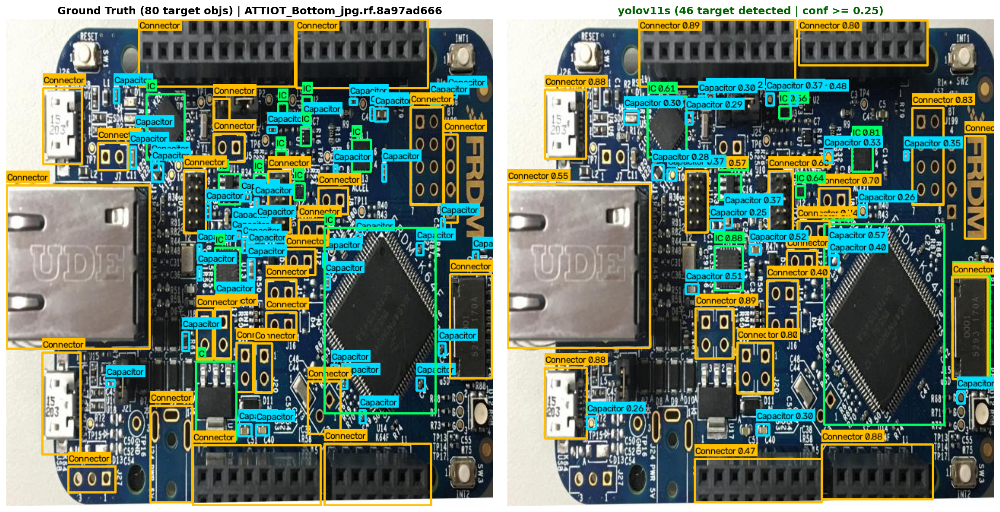

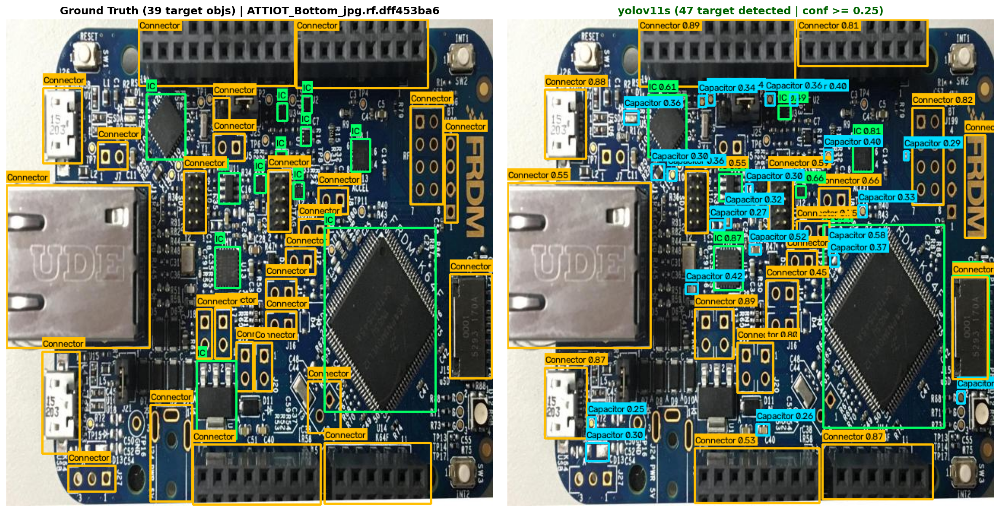

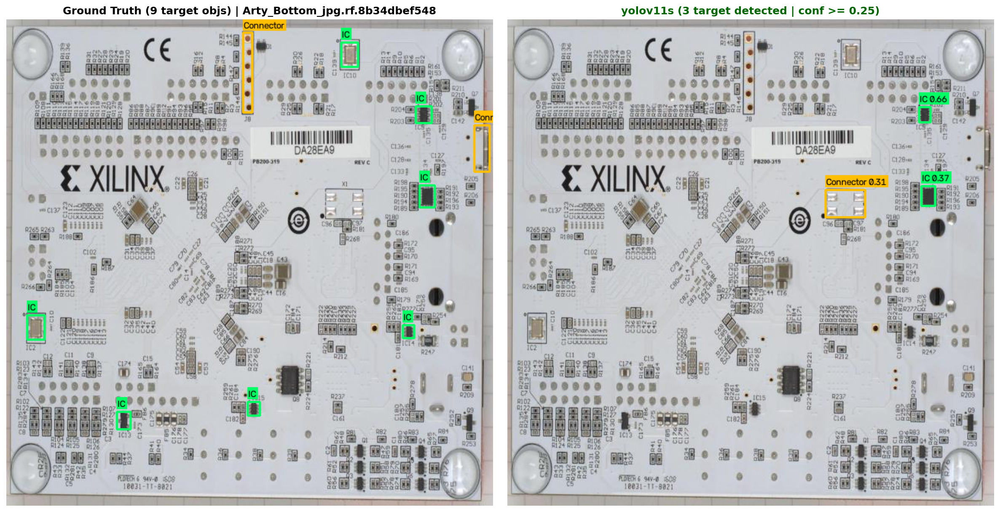

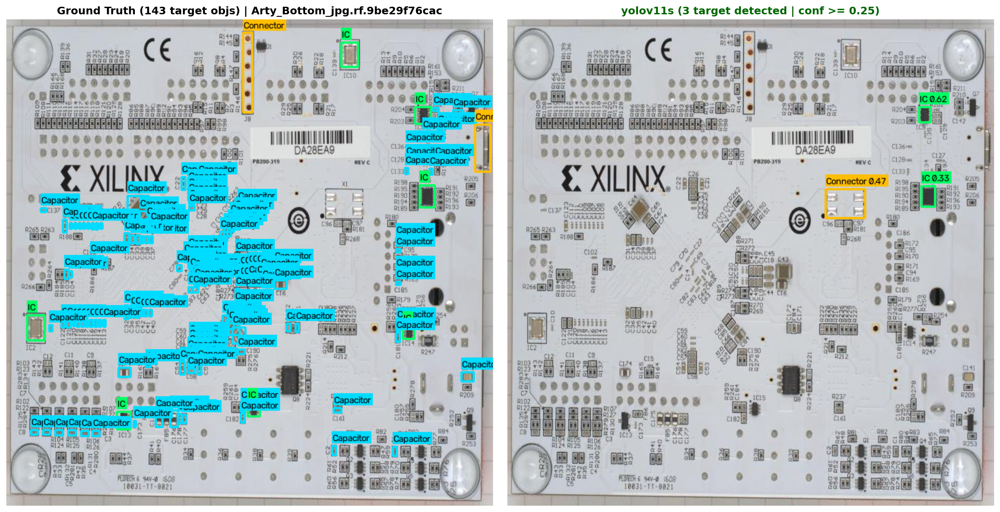

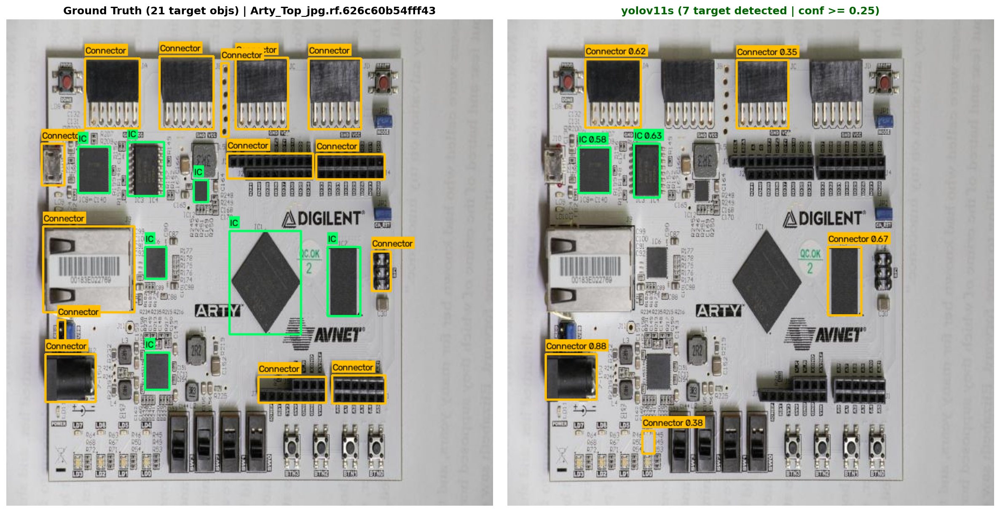

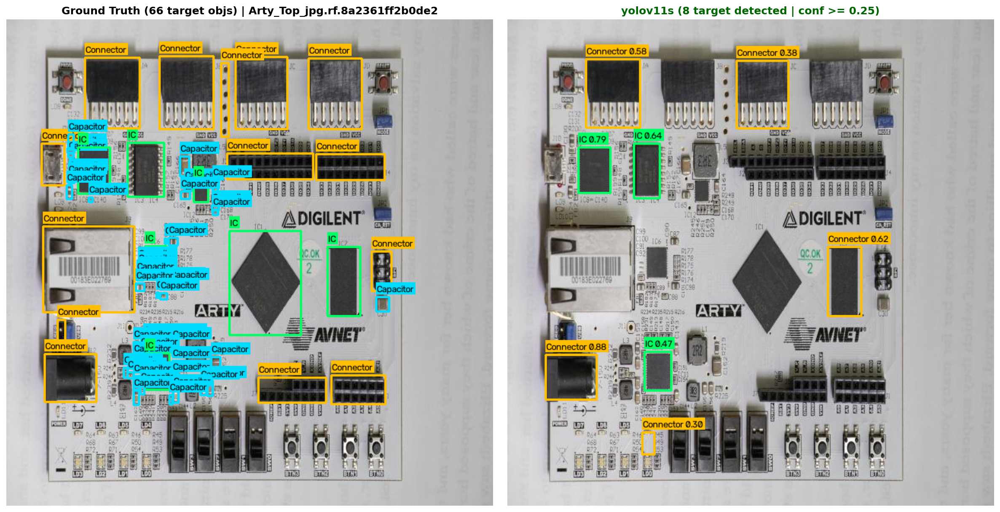

In [6]:
# 6. Visual Comparison Gallery (Ground Truth vs Model Predictions)
sample_images = sorted(glob.glob("data_samples/images/*.jpg"))[:6]

if not sample_images:
    print("❌ No images found in data_samples/images/*.jpg! Check directory path.")
else:
    print(f"🔍 Displaying {len(sample_images)} test PCB samples for model: {CHOSEN_MODEL}")

for img_path in sample_images:
    raw_img = cv2.imread(img_path)
    if raw_img is None:
        continue
    rgb_img = cv2.cvtColor(raw_img, cv2.COLOR_BGR2RGB)
    h, w = rgb_img.shape[:2]
    
    # 1. Load Ground Truth boxes
    lbl_path = img_path.replace("images", "labels").replace(".jpg", ".txt")
    gt_boxes = load_ground_truth(lbl_path, w, h)
    gt_vis = draw_boxes(rgb_img, gt_boxes, is_prediction=False)
    target_gt = [b for b in gt_boxes if b[1] in EVAL_CLASSES.values() or b[0] in EVAL_CLASSES]
    
    # 2. Run Model Inference
    results = model.predict(rgb_img, imgsz=IMGSZ, conf=CONF_THRESHOLD, verbose=False)[0]
    pred_boxes = []
    for box in results.boxes:
        cls_id = int(box.cls[0])
        conf = float(box.conf[0])
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        cls_name = model.names[cls_id] if cls_id in model.names else RAW_CLASSES[cls_id]
        pred_boxes.append((cls_id, cls_name, conf, x1, y1, x2, y2))
        
    pred_vis = draw_boxes(rgb_img, pred_boxes, is_prediction=True)
    target_preds = [b for b in pred_boxes if b[1] in EVAL_CLASSES.values() or b[0] in EVAL_CLASSES]
    
    # 3. Render Side-by-Side
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    
    axes[0].imshow(gt_vis)
    axes[0].set_title(f"Ground Truth ({len(target_gt)} target objs) | {Path(img_path).name[:30]}", fontsize=12, fontweight='bold')
    axes[0].axis("off")
    
    axes[1].imshow(pred_vis)
    axes[1].set_title(f"{CHOSEN_MODEL} ({len(target_preds)} target detected | conf >= {CONF_THRESHOLD})", fontsize=12, fontweight='bold', color='darkgreen' if len(target_preds) > 0 else 'black')
    axes[1].axis("off")
    
    plt.tight_layout()
    plt.show()


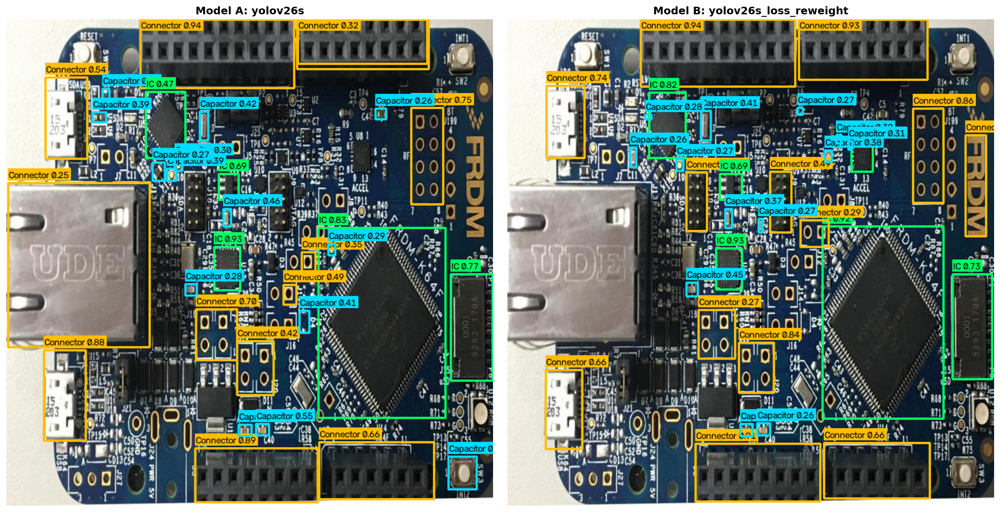

In [7]:
# 7. Compare Two Models Side-by-Side (e.g. Baseline vs Improved Technique)
def compare_two_models(model_a_name, model_b_name, img_path, conf=0.25):
    raw_img = cv2.imread(img_path)
    rgb_img = cv2.cvtColor(raw_img, cv2.COLOR_BGR2RGB)
    
    mA = YOLO(f"runs/{model_a_name}/pcb-filtered/weights/best.pt")
    mB = YOLO(f"runs/{model_b_name}/pcb-filtered/weights/best.pt")
    
    resA = mA.predict(rgb_img, imgsz=640, conf=conf, verbose=False)[0]
    resB = mB.predict(rgb_img, imgsz=640, conf=conf, verbose=False)[0]
    
    boxesA = [(int(b.cls[0]), mA.names[int(b.cls[0])], float(b.conf[0]), int(b.xyxy[0][0]), int(b.xyxy[0][1]), int(b.xyxy[0][2]), int(b.xyxy[0][3])) for b in resA.boxes]
    boxesB = [(int(b.cls[0]), mB.names[int(b.cls[0])], float(b.conf[0]), int(b.xyxy[0][0]), int(b.xyxy[0][1]), int(b.xyxy[0][2]), int(b.xyxy[0][3])) for b in resB.boxes]
    
    visA = draw_boxes(rgb_img, boxesA, is_prediction=True)
    visB = draw_boxes(rgb_img, boxesB, is_prediction=True)
    
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    axes[0].imshow(visA)
    axes[0].set_title(f"Model A: {model_a_name}", fontsize=12, fontweight='bold')
    axes[0].axis("off")
    
    axes[1].imshow(visB)
    axes[1].set_title(f"Model B: {model_b_name}", fontsize=12, fontweight='bold')
    axes[1].axis("off")
    
    plt.tight_layout()
    plt.show()

# Example comparison between Baseline YOLO26s and Loss Reweighted YOLO26s:
if len(sample_images) > 0 and os.path.exists("runs/yolov26s/pcb-filtered/weights/best.pt") and os.path.exists("runs/yolov26s_loss_reweight/pcb-filtered/weights/best.pt"):
    compare_two_models("yolov26s", "yolov26s_loss_reweight", sample_images[0], conf=0.25)